# **PART 3: Caption Generation**


## Imports

In [ ]:
# basic utilities
from scipy.io import loadmat
import numpy as np
from skimage import io
import cv2
from PIL import Image
import os
import nltk
import  nltk.translate.bleu_score as bleu
import matplotlib.pyplot as plt

# importing tenserflow 
from tensorflow import keras
from tensorflow.keras import Sequential
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Input, Dropout, Flatten, LSTM, Embedding, BatchNormalization
from tensorflow.keras.layers import (LSTM, Embedding, 
    TimeDistributed, Dense, RepeatVector, 
    Activation, Flatten, Reshape, concatenate,  
    Dropout, BatchNormalization)
from tensorflow.keras.applications import VGG16, InceptionV3
from keras.optimizers import Adam, RMSprop
from keras.layers.wrappers import Bidirectional
from keras.layers.merge import add
from keras.applications.inception_v3 import preprocess_input
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.callbacks import EarlyStopping
from keras.utils import to_categorical
from keras.preprocessing.sequence import pad_sequences

# importing train-test split
from sklearn.model_selection import train_test_split

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# loading pascal dataset
pascal = loadmat('/content/drive/MyDrive/DL_Project/pascal50S.mat')

In [ ]:
# sanity check
pascal['train_sent_final'][0][1][1][0][1][0]

'two flags flying as a train engine passes by'

In [ ]:
# loading resized image from previous tasks
!gdown --id 1-4zf03wZl4LmbC5aDMkzJSW-jEqWOTCF
!gdown --id 1-E0i0FncUxjbSMhncuJyAj8WAxAk-nKI

Downloading...
From: https://drive.google.com/uc?id=1-4zf03wZl4LmbC5aDMkzJSW-jEqWOTCF
To: /content/image_data.npy
188MB [00:00, 204MB/s]
Downloading...
From: https://drive.google.com/uc?id=1-E0i0FncUxjbSMhncuJyAj8WAxAk-nKI
To: /content/targets.npy
100% 168k/168k [00:00<00:00, 61.6MB/s]


In [ ]:
# load images -- all are 250 x 250
images = np.load('image_data.npy')
images[0].shape

(250, 250, 3)

In [ ]:
# train-test split of database - note that we are splitting the indexes of images, we will use train_index images to train and test_index_images to test 
indexes = np.arange(0, 1000, 1)
train_index, test_index, _, _ = train_test_split(indexes, indexes, random_state=42, test_size=0.05)
train_index.shape, test_index.shape

((950,), (50,))

In [ ]:
# index of images which we are going to use to test our model
test_index

array([521, 737, 740, 660, 411, 678, 626, 513, 859, 136, 811,  76, 636,
       973, 938, 899, 280, 883, 761, 319, 549, 174, 371, 527, 210, 235,
       101, 986, 902, 947, 346, 139, 621, 499, 370, 198, 687, 584, 901,
        59, 328,  96, 312, 974, 299, 277, 924, 601, 439, 837])

In [ ]:
# image index : description list (dictionary formation)
data = pascal['train_sent_final']
data = data.flatten()

# { image index: list of captions }
train_image_desc = {}

for i in train_index:
    data[i][1] = data[i][1].flatten()
    train_image_desc[i] = []
    for sentence in (data[i][1]):
        sentence = sentence[0]
        train_image_desc[i].append(sentence)

In [ ]:
# first 10 captions for first image
train_image_desc[0][:10]

['Man in a boat fishing.',
 'a man fishing out of a canoe',
 'A lone fisherman in a rowboat on an empty lake.',
 'A person is fishing in a boat on a lake.',
 'A man is fishing in the river.',
 'A man fishing in a canoe on a lake',
 'A man fishes in a canoe in an empty lake',
 'A man in a canoe is fishing.',
 'A person in a canoe fishes on a lake.',
 'A man in his canoe fishing on the lake.']

In [ ]:
# Cleaning descriptions

# Start_Seq and End_Seq are markers required for RNN
START_SEQ = "Start_Seq "
END_SEQ = " End_Seq"

for key in train_image_desc.keys():
    desc_list = train_image_desc[key]


    for i in range(len(desc_list)):
        sentence = desc_list[i]
        # using nltk to tokenize and remove punctuations
        tokenizer = nltk.tokenize.RegexpTokenizer(r'\w+')

        # removing punctuations and converting to list
        word_list = tokenizer.tokenize(sentence)

        # to lower case
        word_list = [word.lower() for word in word_list]

        # removing 'a' -- there were many faced serious issues
        word_list = [word for word in word_list if len(word)>1]

        # remove tokens which have numbers in them
        word_list = [word for word in word_list if word.isalpha()]

        # converting back to sentence
        sentence = START_SEQ + ' '.join(word_list) + END_SEQ

        desc_list[i] = sentence


    train_image_desc[key] = desc_list

In [ ]:
# see how now the captions look like
train_image_desc[0][:10]

['Start_Seq man in boat fishing End_Seq',
 'Start_Seq man fishing out of canoe End_Seq',
 'Start_Seq lone fisherman in rowboat on an empty lake End_Seq',
 'Start_Seq person is fishing in boat on lake End_Seq',
 'Start_Seq man is fishing in the river End_Seq',
 'Start_Seq man fishing in canoe on lake End_Seq',
 'Start_Seq man fishes in canoe in an empty lake End_Seq',
 'Start_Seq man in canoe is fishing End_Seq',
 'Start_Seq person in canoe fishes on lake End_Seq',
 'Start_Seq man in his canoe fishing on the lake End_Seq']

In [ ]:
# complete vocab with frequency of occurances
vocab = {}
for key in train_image_desc.keys():
    desc_list = train_image_desc[key]
    for i in range(len(desc_list)):
        sentence = desc_list[i]
        word_list = sentence.split()
        for w in word_list:
            # incrementing frequency by 1 if already exists
            if w in vocab:
                vocab[w] += 1
            else: # else create a new entry
                vocab[w] = 1

# len of vocab
len(list(vocab.keys()))

7241

In [ ]:
# reducing vocab by removing words which occurs less than 6
reduced_vocab = set()
for key in vocab.keys():
    # if no. less than equalt to 5 just throw away those words
    if vocab[key] > 5:
        reduced_vocab.add(key)

len(reduced_vocab)

2628

In [ ]:
# two dictionaries which are used in training and testing
# index to word
index_to_word = {}
# word to index
word_to_index = {}
i = 1
# using reduced vocab
for w in reduced_vocab:
    word_to_index[w] = i
    index_to_word[i] = w
    i += 1

In [ ]:
# longest caption available in all present
largest_desc_len = 0
for key in train_image_desc.keys():
    desc_list = train_image_desc[key]
    for i in range(len(desc_list)):
        sentence = desc_list[i]
        word_list = sentence.split()
        if(len(word_list) > largest_desc_len):
            largest_desc_len = len(word_list)

print(largest_desc_len)

35


Encoding the images into image vector using InceptionV3

In [ ]:
# The inceptionV3 model - using pretrained model with input size 250x250
def inceptionV3(height=250, width=250, pretrained=True):
    model = InceptionV3(weights='imagenet', input_tensor=Input(shape=(height, width, 3)))
    model = Model(model.input, model.layers[-2].output)
    return model

In [ ]:
# function which preprocesses image and then provides an encoding which is output of inceptionV3's first n-2 layers
def encode_image(img, model):
    img = np.expand_dims(img, axis=0)
    img = preprocess_input(img)
    ret = model.predict(img)
    return np.reshape(ret, (ret.shape[1],))

In [ ]:
# getting encodings for each train image
train_images = images[train_index]
inception_encoder = inceptionV3()
train_encodings = {}
for i in range(train_index.shape[0]):
    img = images[train_index[i]]
    train_encodings[train_index[i]] = encode_image(img, inception_encoder)

96116736/96112376 [==============================] - 1s 0us/step


In [ ]:
# example
train_encodings[0]

array([0.1651304 , 0.09053441, 0.21766281, ..., 0.        , 0.16289012,
       0.43485066], dtype=float32)

In [ ]:
# the generator - generates a batch for training
# batch includes images_per_batch no. of images and desc_of_image no. of captions of the image
def generator(img_desc, img_encoding, word_to_index, largest_desc_len, images_per_batch, desc_of_image, vocab_len):
    X1, X2, y = [], [], []
    n = 0
    temp = {}

    # temp is a dictionary which maintains which captions for a image are done
    for key in img_desc.keys():
        temp[key] = 0
    
    while True:
        # each image
        for key in img_desc.keys():
            n += 1
            encoding = img_encoding[key]
            desc_list = img_desc[key]
            c = 0
            for i in range(len(desc_list)):
                # if all captions done - restart the caption list (50 captions per image)
                if temp[key] >= 50:
                    temp[key] = 0

                # break if no. of captions to be used limit is reached
                if c >= desc_of_image:
                    break
                
                # tokens of word
                rnn_seq = [word_to_index[word] for word in desc_list[temp[key]].split(' ') if word in word_to_index]
                
                for i in range(1, len(rnn_seq)):
                    # split to input and output 
                    in_seq, out_seq = rnn_seq[:i], rnn_seq[i]

                    # pad 0s in input upto max length caption
                    in_seq = pad_sequences([in_seq], maxlen=largest_desc_len)[0]

                    # one-hot encode output sequence
                    out_seq = to_categorical([out_seq], num_classes=vocab_len)[0]

                    # append them to the list
                    X1.append(encoding)
                    X2.append(in_seq)
                    y.append(out_seq) 

                c += 1
                temp[key] += 1
            
            # if no. of images required limit is reached just return and whenever called back continue
            if n==images_per_batch:
                yield ([np.array(X1), np.array(X2)], np.array(y))
                X1, X2, y = list(), list(), list()
                n=0

In [ ]:
# import glove for embedding
!wget http://nlp.stanford.edu/data/glove.6B.zip
!unzip -q glove.6B.zip

--2021-05-13 21:32:25--  http://nlp.stanford.edu/data/glove.6B.zip
Resolving nlp.stanford.edu (nlp.stanford.edu)... 171.64.67.140
Connecting to nlp.stanford.edu (nlp.stanford.edu)|171.64.67.140|:80... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://nlp.stanford.edu/data/glove.6B.zip [following]
--2021-05-13 21:32:25--  https://nlp.stanford.edu/data/glove.6B.zip
Connecting to nlp.stanford.edu (nlp.stanford.edu)|171.64.67.140|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: http://downloads.cs.stanford.edu/nlp/data/glove.6B.zip [following]
--2021-05-13 21:32:25--  http://downloads.cs.stanford.edu/nlp/data/glove.6B.zip
Resolving downloads.cs.stanford.edu (downloads.cs.stanford.edu)... 171.64.64.22
Connecting to downloads.cs.stanford.edu (downloads.cs.stanford.edu)|171.64.64.22|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 862182613 (822M) [application/zip]
Saving to: ‘glove.6B.zip’

glove.6

In [ ]:
# Load Glove vectors
glove_dir = '/content'
embeddings_index = {} # empty dictionary
f = open(os.path.join(glove_dir, 'glove.6B.300d.txt'), encoding="utf-8")

# getting words and their embeddings (using 300d vectors) 
for line in f:
    values = line.split()
    word = values[0]
    coefs = np.asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefs
f.close()
print('Found %s word vectors.' % len(embeddings_index))

Found 400000 word vectors.


In [ ]:
embedding_dim = 300

embedding_matrix = np.zeros((len(reduced_vocab)+1, embedding_dim))
for word, i in word_to_index.items():
    #if i < max_words:
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        # Words not found in the embedding index will be all zeros
        embedding_matrix[i] = embedding_vector

In [ ]:
embedding_matrix.shape

(2629, 300)

# MODEL





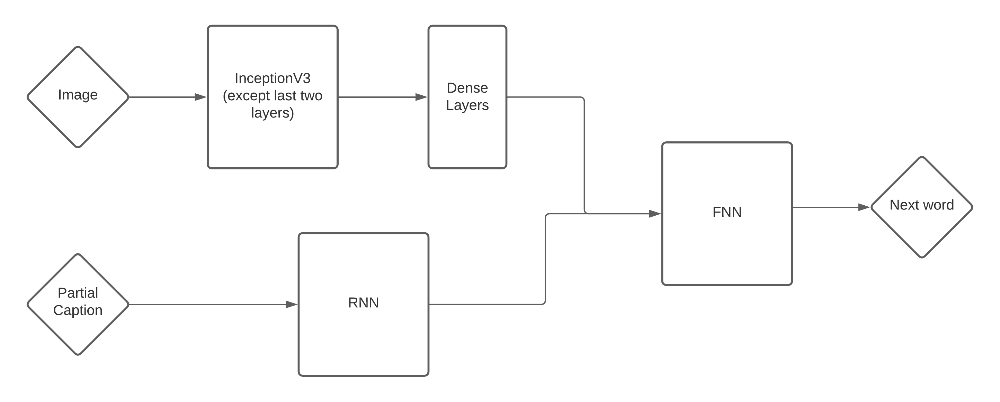

In [ ]:
# the FNN in front of CNN
inputs1 = Input(shape=(2048,))
fe1 = Dropout(0.5)(inputs1)
fe4 = Dense(256, activation='relu')(fe1)

# the RNN
inputs2 = Input(shape=(largest_desc_len,))
se1 = Embedding(len(reduced_vocab)+1, embedding_dim, mask_zero=True)(inputs2)
se2 = Dropout(0.5)(se1)
se3 = LSTM(256)(se2)

# the decoder
decoder1 = add([fe4, se3])
decoder2 = Dense(512, activation='relu')(decoder1)
outputs = Dense(len(reduced_vocab)+1, activation='softmax')(decoder2)
model = Model(inputs=[inputs1, inputs2], outputs=outputs)

In [ ]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 35)]         0                                            
__________________________________________________________________________________________________
input_2 (InputLayer)            [(None, 2048)]       0                                            
__________________________________________________________________________________________________
embedding (Embedding)           (None, 35, 300)      788700      input_3[0][0]                    
__________________________________________________________________________________________________
dropout (Dropout)               (None, 2048)         0           input_2[0][0]                    
____________________________________________________________________________________________

In [ ]:
model.layers[2]

In [ ]:
# Won't be training glove weights.
model.layers[2].set_weights([embedding_matrix])
model.layers[2].trainable = False

In [ ]:
model.compile(optimizer='adam', loss='categorical_crossentropy')

# Training

In [ ]:
# training parameters
epochs = 200
images_per_batch = 5
steps = 950//images_per_batch

In [ ]:
for i in range(epochs):
    gen = generator(train_image_desc, train_encodings, word_to_index, largest_desc_len, images_per_batch, 5, len(reduced_vocab)+1)
    model.fit_generator(gen, epochs=1, steps_per_epoch=steps, verbose=1)

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


190/190 [==============================] - 20s 104ms/step - loss: 0.4565


In [ ]:
model.save('/content/drive/MyDrive/DL_Project/model_200.h5')

In [ ]:
# training parameters -- increasing images per batch and reducing initial lr
model.optimizer.lr = 0.0001
epochs = 50
images_per_batch = 10
steps = 950//images_per_batch

In [ ]:
for i in range(epochs):
    gen = generator(train_image_desc, train_encodings, word_to_index, largest_desc_len, images_per_batch, 5, len(reduced_vocab)+1)
    model.fit_generator(gen, epochs=1, steps_per_epoch=steps, verbose=1)

 1/95 [..............................] - ETA: 11s - loss: 0.4168

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


95/95 [==============================] - 11s 117ms/step - loss: 0.3785


In [ ]:
# training parameters -- increasing images per batch and reducing initial lr
model.optimizer.lr = 0.00001
epochs = 50
images_per_batch = 25
steps = 950//images_per_batch

In [ ]:
for i in range(epochs):
    gen = generator(train_image_desc, train_encodings, word_to_index, largest_desc_len, images_per_batch, 5, len(reduced_vocab)+1)
    model.fit_generator(gen, epochs=1, steps_per_epoch=steps, verbose=1)

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


38/38 [==============================] - 6s 151ms/step - loss: 0.3556


In [ ]:
model.save('/content/drive/MyDrive/DL_Project/model_200.h5')
model.save_weights('/content/drive/MyDrive/DL_Project/model_200_weights.h5')

In [ ]:
# loading weights
model_ = keras.models.load_model('/content/drive/MyDrive/DL_Project/model_200.h5')

# Testing the Model

In [ ]:
def findCaption(photo):
    in_text = 'Start_Seq'
    for i in range(largest_desc_len):
        sequence = [word_to_index[w] for w in in_text.split() if w in word_to_index]
        sequence = pad_sequences([sequence], maxlen=largest_desc_len)
        yhat = model.predict([photo,sequence], verbose=0)
        yhat = np.argmax(yhat)
        word = index_to_word[yhat]
        in_text += ' ' + word
        if word == 'End_Seq':
            break
    final = in_text.split()
    final = final[1:-1]
    final = ' '.join(final)
    return final

## HOW CAPTIONS ON TRAIN DATA LOOK LIKE

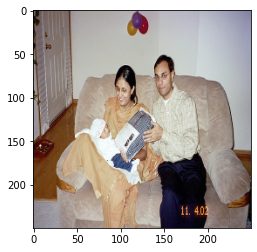

Caption: man and women celebrating birthday with child on the women lap
Bleu Score:  1.0


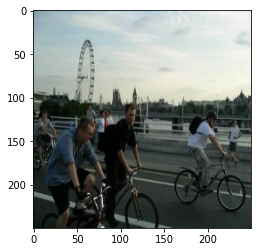

Caption: group of cyclists riding on bridge
Bleu Score:  1.0


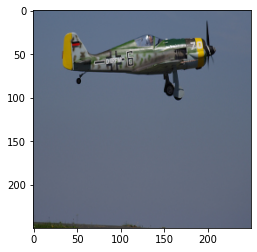

Caption: fighter plane flies in the sky
Bleu Score:  1.0


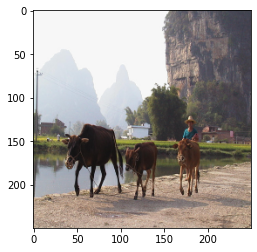

Caption: woman leading some and riding cow
Bleu Score:  0.7952707287670506


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 4-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


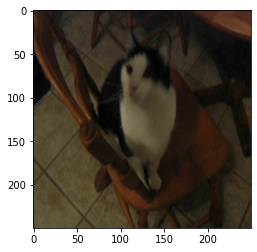

Caption: cat sitting on chair
Bleu Score:  0.6065306597126334


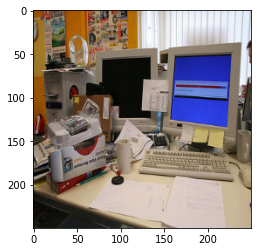

Caption: computer loading
Bleu Score:  0.22313016014842982


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 3-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


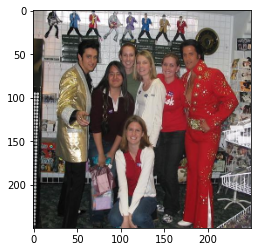

Caption: group poses with some elvis impersonators
Bleu Score:  1.0


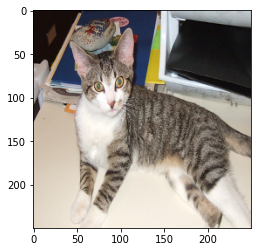

Caption: lounging cat looks directly at the camera
Bleu Score:  1.0


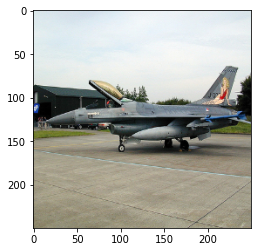

Caption: fighter jet with women painted on it parked in an airport
Bleu Score:  1.0


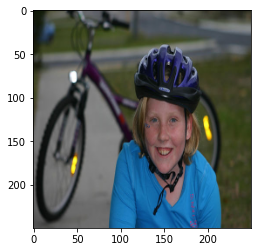

Caption: pretty little girl about to go for ride on her bike
Bleu Score:  1.0


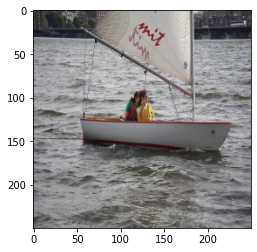

Caption: two people are sailing on boat in the water
Bleu Score:  1.0


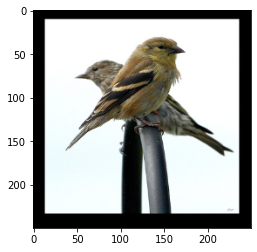

Caption: two birds are perched on top of bar
Bleu Score:  1.0


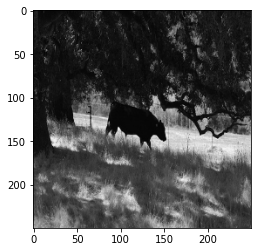

Caption: cow walking through field underneath low hanging branch of tree
Bleu Score:  1.0


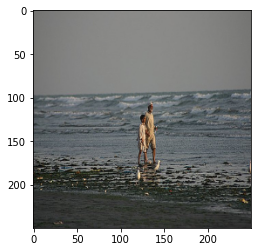

Caption: two males walking on beach past some birds
Bleu Score:  1.0


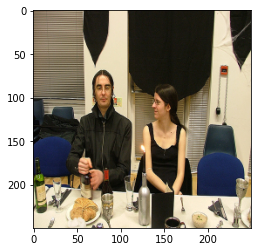

Caption: two seated people dressed in black drinking and eating
Bleu Score:  1.0


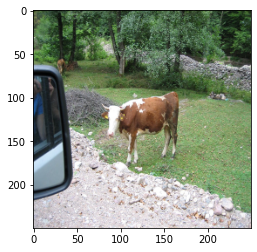

Caption: spotted cow is staring at car
Bleu Score:  1.0


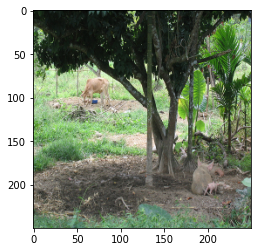

Caption: cow and some pigs by tree in the grass
Bleu Score:  1.0


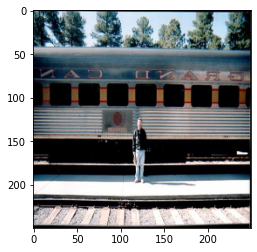

Caption: man standing in front of passenger train
Bleu Score:  1.0


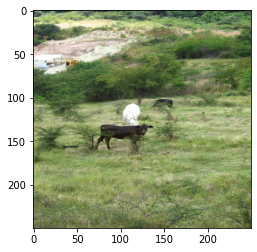

Caption: small calf is looking for good grass
Bleu Score:  1.0


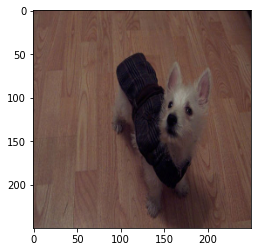

Caption: small dog standing on wooden floor with plaid shirt on
Bleu Score:  1.0


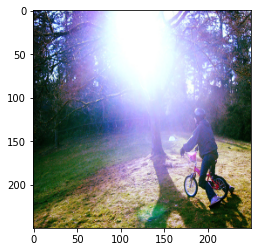

Caption: teenager rides bike that looks bit too small for him on the grass
Bleu Score:  1.0


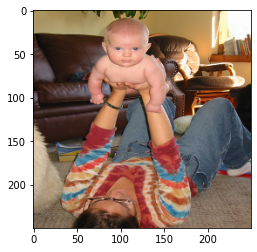

Caption: woman does with baby
Bleu Score:  0.7037259479962376


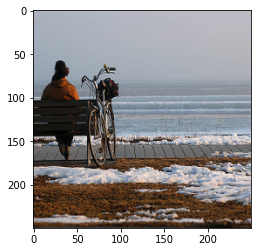

Caption: person sitting on bench watching the ocean
Bleu Score:  1.0


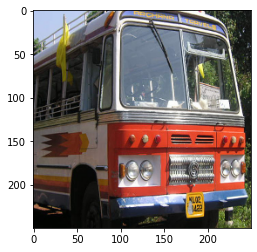

Caption: an older travel bus shows design on the side
Bleu Score:  0.7476743906106103


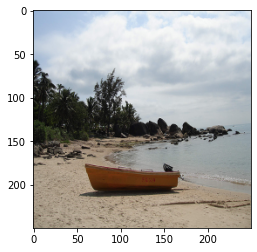

Caption: canoe is sitting on beach
Bleu Score:  1.0


In [ ]:
for _ in range(25):
    i = np.random.randint(0, 950);
    i = train_index[i]
    plt.imshow(images[i])
    plt.show()
    caption = findCaption(train_encodings[i].reshape((1, 2048)))
    org = [d.split() for d in train_image_desc[i]]
    print("Caption:", caption)
    print("Bleu Score: ", bleu.sentence_bleu(org, caption.split()))

## HOW CAPTIONS ON 50 TEST IMAGES LOOK LIKE

In [ ]:
# getting captions for test images
test_image_desc = {}

for i in test_index:
    data[i][1] = data[i][1].flatten()
    test_image_desc[i] = []
    for sentence in (data[i][1]):
        sentence = sentence[0]
        test_image_desc[i].append(sentence)

In [ ]:
for key in test_image_desc.keys():
    desc_list = test_image_desc[key]


    for i in range(len(desc_list)):
        sentence = desc_list[i]
        # using nltk to tokenize and remove punctuations
        tokenizer = nltk.tokenize.RegexpTokenizer(r'\w+')

        # removing punctuations and converting to list
        word_list = tokenizer.tokenize(sentence)

        # to lower case
        word_list = [word.lower() for word in word_list]

        # removing 'a' -- there were many faced serious issues
        word_list = [word for word in word_list if len(word)>1]

        # remove tokens which have numbers in them
        word_list = [word for word in word_list if word.isalpha()]

        desc_list[i] = sentence


    test_image_desc[key] = desc_list

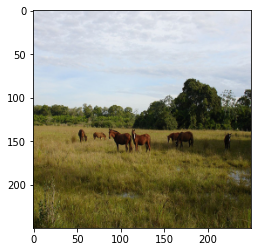

Caption: brown and white cow approaches in field
Bleu Score:  0.8694417438899827


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


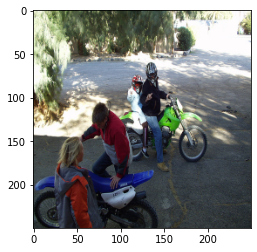

Caption: man is riding in the river
Bleu Score:  0.9554427922043668


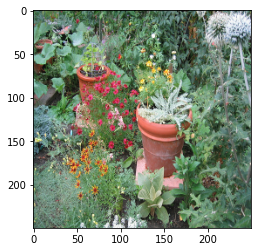

Caption: bush is pink flowers on the side of house
Bleu Score:  0.816496580927726


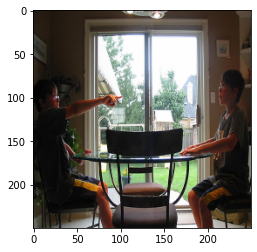

Caption: woman is standing in the hallway of house
Bleu Score:  0.8408964152537145


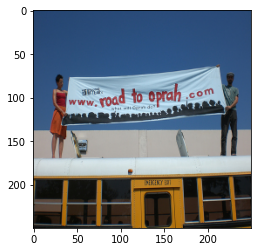

Caption: red bus driving by building
Bleu Score:  0.6511126026643229


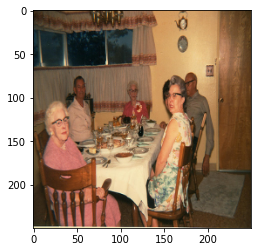

Caption: group of people are at restaurant
Bleu Score:  0.537284965911771


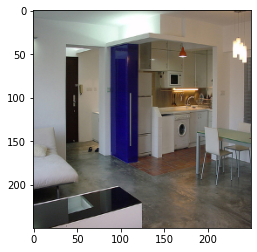

Caption: kitchen area with white table and chairs sink and shelf with toys and books
Bleu Score:  0.4071220775553065


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 3-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


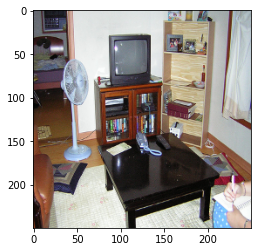

Caption: the tv is on and video game is on the screen
Bleu Score:  0.4832697830906221


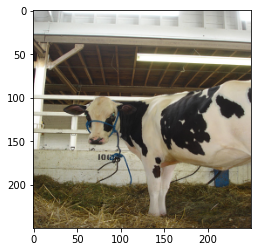

Caption: small child milks cow
Bleu Score:  0.5506953149031838


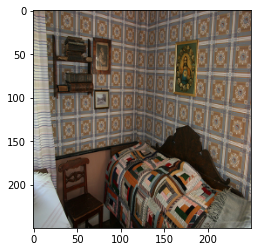

Caption: union jack sofa is next to matching lamp
Bleu Score:  0.48109772909788073


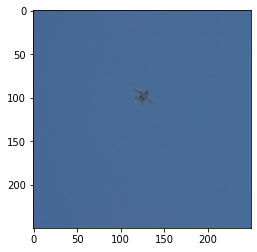

Caption: small plane flying trough the air
Bleu Score:  0.8408964152537145


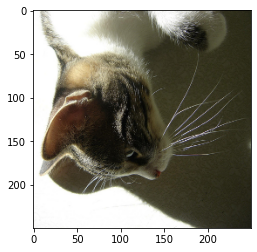

Caption: cat is laying on toy
Bleu Score:  0.668740304976422


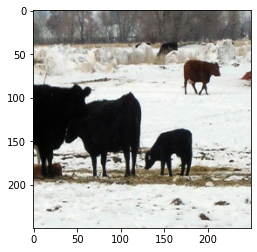

Caption: black brown colored cows lying in pasture
Bleu Score:  0.9193227152249185


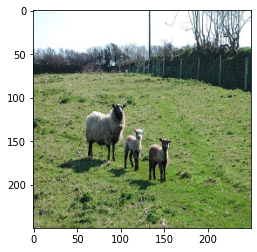

Caption: two rams are grazing in pasture
Bleu Score:  0.537284965911771


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 4-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


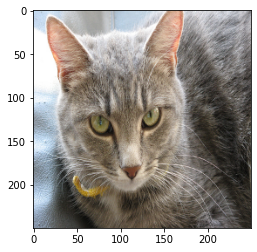

Caption: cat is staring at the camera on the beach sand
Bleu Score:  0.5019724248795793


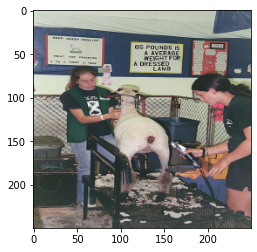

Caption: two women sitting on couch in the field
Bleu Score:  0.8891397050194614


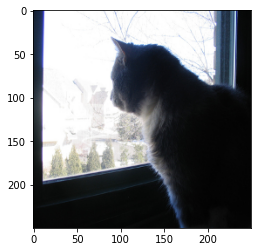

Caption: cat is lying on its back because it wants its belly
Bleu Score:  0.4063798282013443


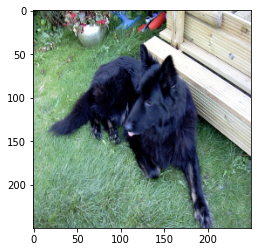

Caption: black dog standing on medium grass
Bleu Score:  0.6042750794713536


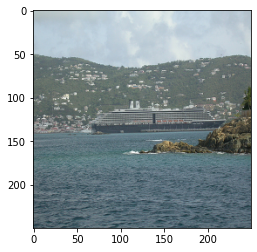

Caption: group of friends enjoy an amusement park
Bleu Score:  0.7311104457090247


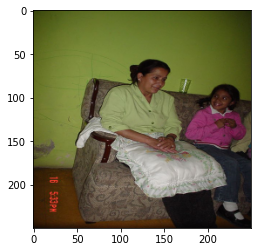

Caption: two people sit on couch
Bleu Score:  0.8408964152537145


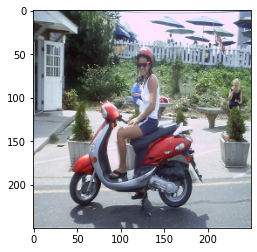

Caption: two men checking out the scooter
Bleu Score:  0.7598356856515925


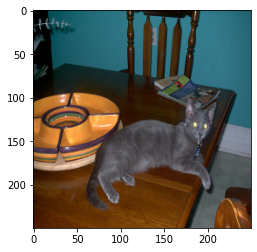

Caption: cat is sitting in window facing the camera
Bleu Score:  0.45966135761245924


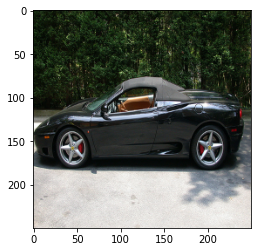

Caption: this is an old firehouse
Bleu Score:  0.6223329772884784


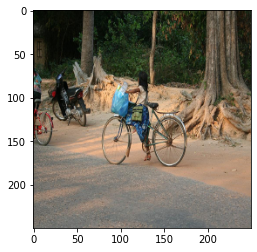

Caption: man rides his bicycle on an empty lot
Bleu Score:  0.5169731539571706


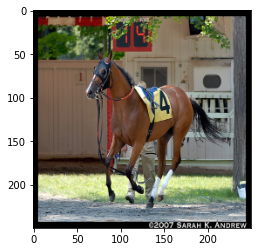

Caption: person is riding horse
Bleu Score:  0.7071067811865475


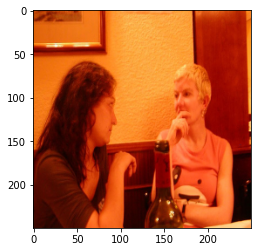

Caption: woman is holding two baby
Bleu Score:  0.7952707287670506


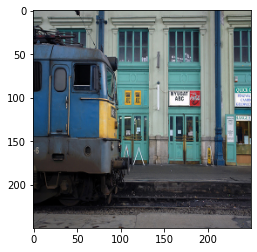

Caption: train at the station waiting for more passengers to load
Bleu Score:  0.47287080450158786


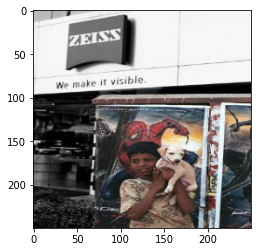

Caption: two children playing baseball outdoors in room
Bleu Score:  0.7311104457090247


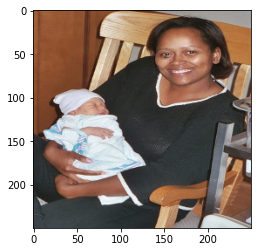

Caption: man and woman are sitting very close on love seat
Bleu Score:  0.8801117367933934


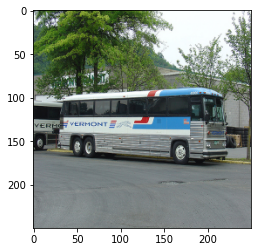

Caption: the red white and yellow bus number is
Bleu Score:  0.4347208719449914


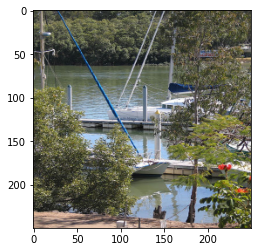

Caption: man paddles gondola with bright city lights in the background
Bleu Score:  0.427287006396234


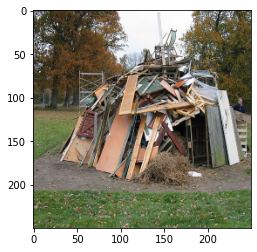

Caption: rundown house has broken front door
Bleu Score:  0.4728708045015879


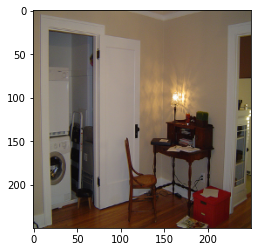

Caption: an old stove in the dining room
Bleu Score:  0.5873949094699213


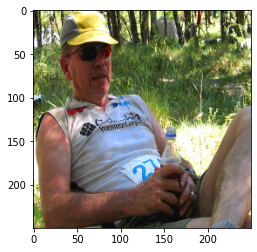

Caption: two young friends pose together by waterfall
Bleu Score:  0


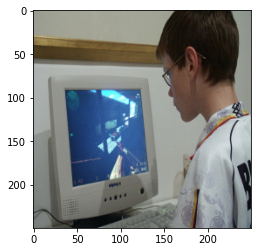

Caption: computer monitor is turned off
Bleu Score:  0.8801117367933934


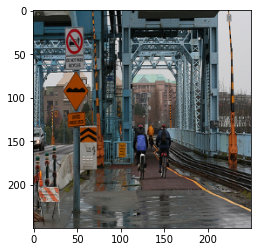

Caption: people are waiting for the bus to arrive
Bleu Score:  0.5169731539571706


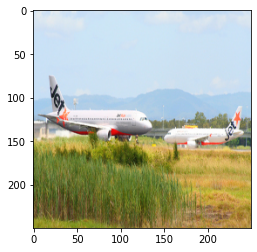

Caption: lufthansa jet takes off
Bleu Score:  0.8408964152537145


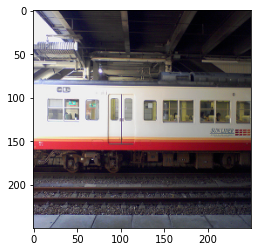

Caption: train carts stationary at an empty station
Bleu Score:  0.9193227152249185


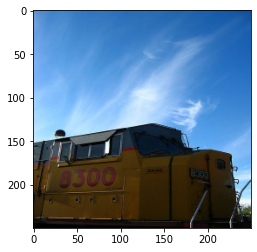

Caption: red and yellow train on tracks that in front of fence with the on it
Bleu Score:  0.3767471803151817


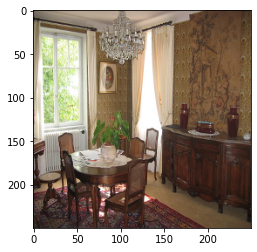

Caption: dining room table covered with stuff
Bleu Score:  0.5081327481546147


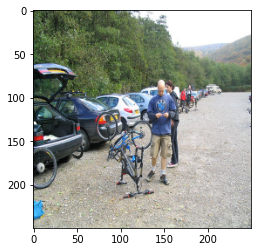

Caption: man rides dirt bike while another man
Bleu Score:  0.8091067115702212


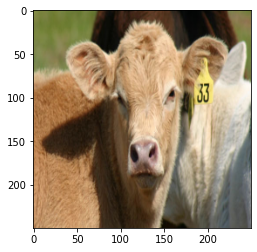

Caption: cow is standing in snowy field
Bleu Score:  0.5081327481546147


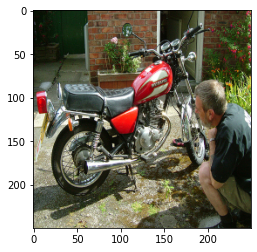

Caption: two motorcycles sitting in garage
Bleu Score:  0


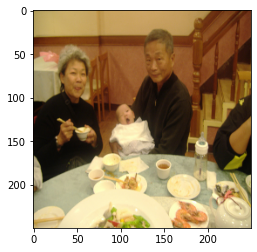

Caption: group of people eating outside at restaurant
Bleu Score:  0.488923022434901


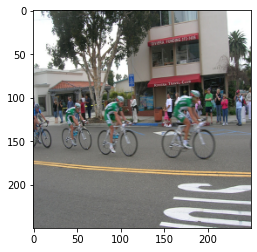

Caption: an old bicycle is standing inside table
Bleu Score:  0.8091067115702212


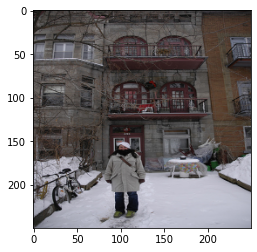

Caption: black and white photo shows of dark folded is smiling for the camera
Bleu Score:  0.46024953713619404


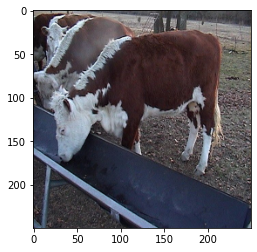

Caption: cow is standing in snowy field
Bleu Score:  0.6042750794713536


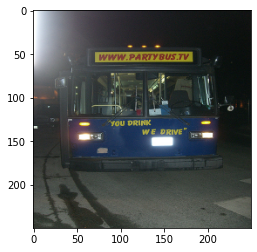

Caption: the bus is arriving at the old white
Bleu Score:  0.6500593260343691


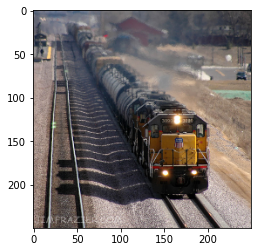

Caption: school bus stopped in front of car station
Bleu Score:  0.8408964152537145


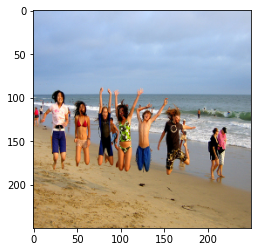

Caption: women are looking at clothing on above them
Bleu Score:  0.7825422900366437


In [ ]:
for i in test_index:
    plt.imshow(images[i])
    plt.show()
    caption = findCaption(encode_image(images[i], inception_encoder).reshape((1, 2048)))
    org = [d.split() for d in test_image_desc[i]]
    print("Caption:", caption)
    print("Bleu Score: ", bleu.sentence_bleu(org, caption.split()))

## SOME RANDOM PERSONAL AND INTERNET IMAGES

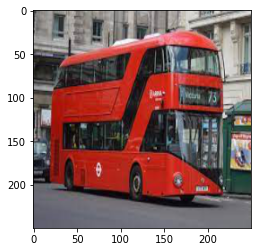

Caption: double decker bus on the street in london england


In [ ]:
img = Image.open('/content/bus.jpg')
resized_img = cv2.resize(np.asarray(img), (250, 250))
plt.imshow(resized_img)
plt.show()
print("Caption:",findCaption(encode_image(resized_img, inception_encoder).reshape((1, 2048))))

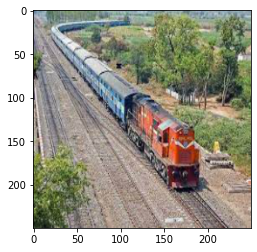

Caption: train is going down the tracks


In [ ]:
img = Image.open('/content/train.jpg')
resized_img = cv2.resize(np.asarray(img), (250, 250))
plt.imshow(resized_img)
plt.show()
print("Caption:",findCaption(encode_image(resized_img, inception_encoder).reshape((1, 2048))))

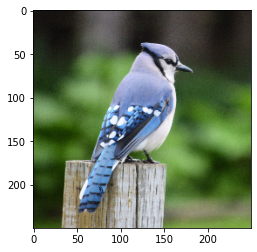

Caption: young man is on the grassy field with her dog


In [ ]:
img = Image.open('/content/bird.jpg')
resized_img = cv2.resize(np.asarray(img), (250, 250))
plt.imshow(resized_img)
plt.show()
print("Caption:",findCaption(encode_image(resized_img, inception_encoder).reshape((1, 2048))))

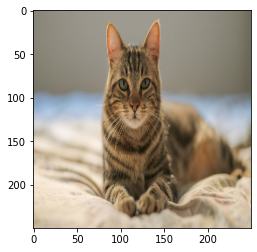

Caption: cat is staring at the camera on the beach sand


In [ ]:
img = Image.open('/content/cat.jpg')
resized_img = cv2.resize(np.asarray(img), (250, 250))
plt.imshow(resized_img)
plt.show()
print("Caption:",findCaption(encode_image(resized_img, inception_encoder).reshape((1, 2048))))

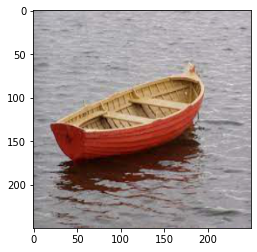

Caption: couple is sailing in sailboat


In [ ]:
img = Image.open('/content/boat.jpg')
resized_img = cv2.resize(np.asarray(img), (250, 250))
plt.imshow(resized_img)
plt.show()
print("Caption:",findCaption(encode_image(resized_img, inception_encoder).reshape((1, 2048))))

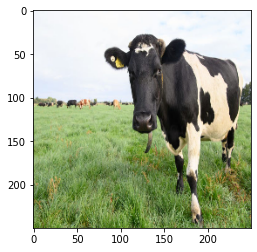

Caption: cow is standing in the snow


In [ ]:
img = Image.open('/content/cow.jpg')
resized_img = cv2.resize(np.asarray(img), (250, 250))
plt.imshow(resized_img)
plt.show()
print("Caption:",findCaption(encode_image(resized_img, inception_encoder).reshape((1, 2048))))

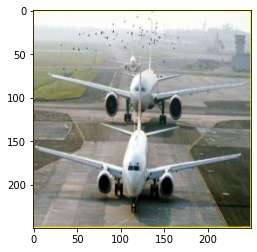

Caption: plane is on the runway while another one has taken to the sky


In [ ]:
img = Image.open('/content/aeroplanes.jpg')
resized_img = cv2.resize(np.asarray(img), (250, 250))
plt.imshow(resized_img)
plt.show()
print("Caption:",findCaption(encode_image(resized_img, inception_encoder).reshape((1, 2048))))

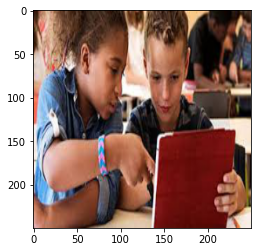

Caption: woman is at event


In [ ]:
img = Image.open('/content/random.jpg')
resized_img = cv2.resize(np.asarray(img), (250, 250))
plt.imshow(resized_img)
plt.show()
print("Caption:",findCaption(encode_image(resized_img, inception_encoder).reshape((1, 2048))))

My Friends's Profile Pictures :)

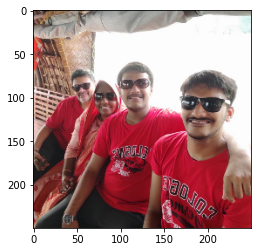

Caption: two men posing for the camera with beer in one of the man hands


In [ ]:
img = Image.open('/content/hasan.jpg')
resized_img = cv2.resize(np.asarray(img), (250, 250))
plt.imshow(resized_img)
plt.show()
print("Caption:",findCaption(encode_image(resized_img, inception_encoder).reshape((1, 2048))))

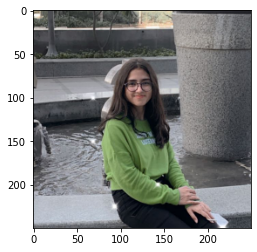

Caption: two women and two woman girls sitting on boat in the middle of river and blue and blue with blue and blue


In [ ]:
img = Image.open('/content/parul.jpg')
resized_img = cv2.resize(np.asarray(img), (250, 250))
plt.imshow(resized_img)
plt.show()
print("Caption:",findCaption(encode_image(resized_img, inception_encoder).reshape((1, 2048))))

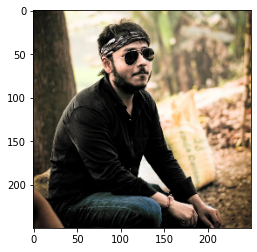

Caption: two young boys hanging out with each other


In [ ]:
img = Image.open('/content/subhajit.jpg')
resized_img = cv2.resize(np.asarray(img), (250, 250))
plt.imshow(resized_img)
plt.show()
print("Caption:",findCaption(encode_image(resized_img, inception_encoder).reshape((1, 2048))))